<a href="https://colab.research.google.com/github/theofarouk/IMDA/blob/main/CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Lab 1 - Convolutional Neural Networks (CNN)**
The objective of this lab is to cover the following points:



1.   How to design a from-scratch model for a multi-label classification problem
2.   How to use a pre-trained model (like VGG16) to predict ImageNet data classes for new images.
3.   How to fine-tune a pre-trained model on another dataset to predict new classes.

**1- Tutorial on Binary classification Fram Scratch**


We propose to use an existing dataset of dogs and cats available on this link:
https://drive.google.com/file/d/1ZOn-D3nq_HMbGLVKn58X54LkDxrT8vMr/view?usp=sharing

The complete dataset is also available on the Kaggle platform:
https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition/data

Download the image database from the google drive link and extract it into a "data" directory. Il contains:
*   train.zip file contains the data we’re going to use to learn our model what a dog or a cat looks like.
*   test.zip file contains the Images we’re going to test our models on after training, to know if our model has learnt to differentiate dogs from cats.

From your Drive, you can then get the data:

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import zipfile
with zipfile.ZipFile("/content/drive/MyDrive/Machine Learning/CNN/data.zip", 'r') as zip_ref:
    zip_ref.extractall("data")

First, let’s import some of the libraries we’re going to use:
* cv2 also called OpenCV, is an image and video processing library available in Python and many other high level programming languages. It is used in reading and resizing Images.
* NumPy is the most popular mathematical library in Python. It makes working and computing large, multi-dimensional arrays and matrices super easy and fast. It has a large collection of high-level mathematical functions to operate on these arrays.
* Pandas pandas is a software library written for the Python programming language for data manipulation and analysis. In particular, it offers data structures and operations for manipulating numerical tables and time series.
* Matplotlib is a plotting library for the Python. It can be used for plotting lines, bar-chart, graphs, histograms and even displaying Images.
* gc short for garbage collector is an important tool for manually cleaning and deleting unnecessary variables.

In [3]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#To see our directory
import os
import random
import gc

After importing the necessary libraries, we read our Images in to memory.

Start by getting all the images in the train and test data zip files and retrieve all images with dog and cat in their name. The train data set contains a total of 25,000 images, but since we are experimenting working with a small data set and we obviously have access to little computational power, we’re going to extract only 2000 images from both classes.


In [4]:
train_dir = 'data/data/train'
test_dir = 'data/data/validation'
train_dogs = ['data/data/train/{}'.format(i) for i in os.listdir(train_dir) if 'dog' in i] #get dog images
train_cats = ['data/data/train/{}'.format(i) for i in os.listdir(train_dir) if 'cat' in i] #get cat images
test_imgs = ['data/data/validation/{}'.format(i) for i in os.listdir(test_dir)] #get test images
train_imgs = train_dogs[:2000] + train_cats[:2000] # slice the dataset and use 2000 in each class
random.shuffle(train_imgs) # shuffle it randomly

It’s important to randomly shuffle the train_imgs.
To view an image from train_imgs

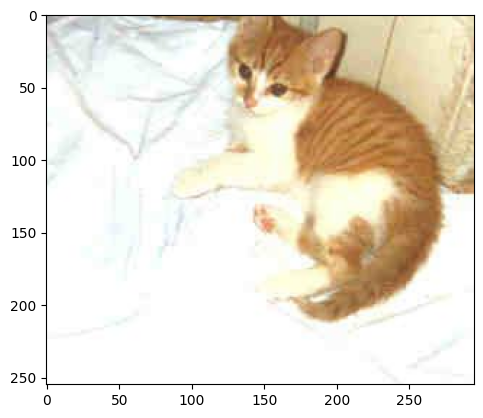

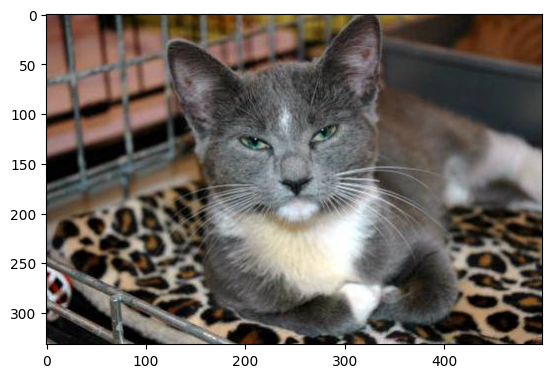

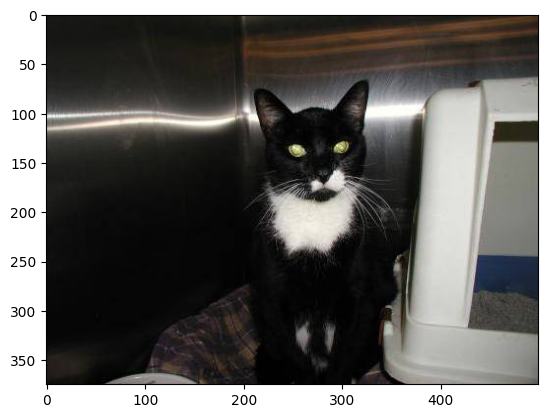

In [5]:
import matplotlib.image as mpimg
for ima in train_imgs[0:3]:
  img = mpimg.imread(ima)
  imgplot = plt.imshow(img)
  plt.show()

Then, read and resize the image (Remember that a colored Image is made up of 3 channels, i.e 3 arrays of red, green and blue pixel values).

In [6]:
nrows = 150
ncolumns = 150
channels = 3 # change to 1 if you want to use grayscale image
# A function to read and process the images to an acceptable format for our model
def read_and_process_image(list_of_images):
  """
  Returns two arrays:
  X is an array of resized images
  y is an array of labels
  """
  X = [] # images
  y = [] # labels
  for image in list_of_images:
    im = cv2.imread(image, cv2.IMREAD_COLOR)
    im2 = cv2.resize(im,(nrows, ncolumns),
    interpolation=cv2.INTER_CUBIC)
    X.append(im2)
    # X.append(cv2.resize(cv2.imread(image, cv2.IMREAD_COLOR),(nrows, ncolumns), interpolation=cv2.INTER_CUBIC)) # Read the image
    # get the label
    if 'dog' in image:
      y.append(1)
    elif 'cat' in image:
      y.append(0)
  return X, y

Now, call this function and process the images.

In [7]:
#get the train and label data
X, y = read_and_process_image(train_imgs)

X is now an array of image pixel values and y is a list of labels. let’s plot the first 5 arrays of X. We can’t plot the images in X with the mpimg module of matplotlib.image above because these are now arrays of pixels not raw jpg files. So we should use the imshow() command (like last exercise).

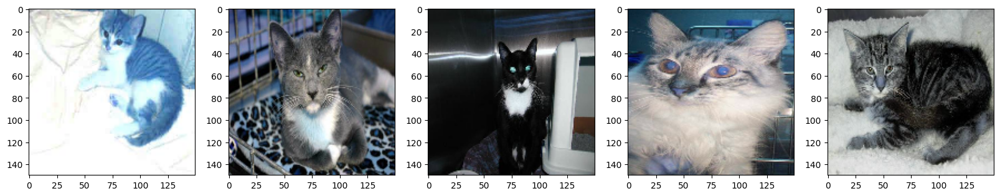

In [8]:
#Lets view some of the pics
plt.figure(figsize=(20,10))
columns = 5
for i in range(columns):
  plt.subplot(5 // columns + 1, columns, i + 1)
  imgplot = plt.imshow(X[i])
plt.show()

Next let’s check the shape of our data. We can see that our image is a tensor of rank 4, or we could say a 4 dimensional array with dimensions 4000 x 150 x 150 x 3 which correspond to the batch size, height, width and channels respectively.

First, convert list to numpy array


In [9]:
X = np.array(X)
y = np.array(y)

print("Shape of train images is:", X.shape)
print("Shape of labels is:", y.shape)

Shape of train images is: (2048, 150, 150, 3)
Shape of labels is: (2048,)


Before starting the training phase, we have to split our data into train and validation set (20% of the data to be assigned to the validation set and the other 80% to the train set).


In [10]:
#Lets split the data into train and test set
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20,
random_state=2)
print("Shape of train images is:", X_train.shape)
print("Shape of validation images is:", X_val.shape)
print("Shape of labels is:", y_train.shape)
print("Shape of labels is:", y_val.shape)
#clear memory
del X
del y
gc.collect()
#get the length of the train and validation data
ntrain = len(X_train)
nval = len(X_val)
#We will use a batch size of 32. Note: batch size should be a factor of 2.***4,8,16,32,64...***
batch_size = 32

Shape of train images is: (1638, 150, 150, 3)
Shape of validation images is: (410, 150, 150, 3)
Shape of labels is: (1638,)
Shape of labels is: (410,)


To create our model, let’s first import the necessary keras modules we are going to use:

1. Layers module which contains different types of layers used in deep learning
* Convolutional layer (Mostly used in computer vision)
* Pooling layer (also used in computer vision)
* Recurrent layer (Mostly used in sequential and time series modelling
* Embedding layers (Mostly used in Natural Language processing)
* Normalization layers
* and many more
2.   Models which contains two types:
* Sequential model which we’ll be using in this tutorial and
* The model with the Functional API

3. Optimizer module that contains different types of back propagation algorithm for training our model. Some of these optimizers are:
* sgd (stochastic gradient descent)
* rmsprop (root mean square propagation)
* Adams
* Adagrad
* Adadelta
4. ImageDataGenerator function used when working with a small data set.

In [11]:
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array, load_img

To create our model, we are going to use an architecture insired from vggnet https://arxiv.org/pdf/1409.1556.pdf, in which you can see below that our filter size increases as we go down layers
32 → 64 →128 →512 — and final layer is 1

In [12]:
model = models.Sequential() # (1)
model.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(150,
150, 3)))#(2)
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2))) # (3)
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten()) # (4)
model.add(layers.Dropout(0.5)) #Dropout for regularization # (5)
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


(1) Here we create a sequential model to stack all layers sequentially.
(2) Here we create the first layer by calling the add() function on the model we created and pass the type of layer we want — a Conv2D layer. This first layer is called the input layer and has some important parameters we need to set.
* filter size [32]: the size of the output dimension (i.e. the number of output filters in the convolution)
* kernel_size [3,3]: specifies the height and width of the 2D convolution window.
* activation [‘relu’]: the activation function to be used by our neural network. ReLU (Rectified Linear Unit) is the most common activation function used today, other variations are leaky ReLU and eLU.
* input shape [150,150,3]:  where 150 by 150 is the size of images including 3 channels each. We do not pass the first dimension of 4000 because that is the batch dimension.

(3) Here we add a MaxPool2D layer. Its function is to reduce the spatial size of the incoming features and therefore helps reduce the number of parameters and computation in the network, thereby helping to reduce overfitting. Overfitting happens when our model memorizes the training data. The model will perform excellently at training time but fail at test time.

(4) Here we add a Flatten layer. A conv2D layers extract and learn spatial features which is then passed to a dense layer after it has been flattened. This is the work of the flatten layer.
(5) Here we add a Dropout layer with value 0.5. Dropout randomly drops some layers in a neural network and then learns with the reduced network. This way, the network learns to be independent and not reliable on a single layer. Bottom-line is that it helps in overfitting. 0.5 means to randomly drop half of the layers.
The last layer has an output size of 1 and a different activation function called sigmoid. This is because we’re trying to detect if an image is a dog or a cat. i.e we want the model to output a probability of how sure an image is a dog and not a cat, that means we want a probability score where higher values mean the classifier believes the image is a dog and lower values means it is a cat. The sigmoid is perfect for this because it takes in a set of numbers and returns a probability distribution in the range of 0 to 1.
We can preview the arrangement and parameter size of our convnet by calling the keras function summary() on the model object.

In [13]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,453,121 (13.17 MB)

 Trainable params: 3,453,121 (13.17 MB)

 Non-trainable params: 0 (0.00 B)

The next step is to compile our model.

In [14]:
model.compile(loss='binary_crossentropy',
optimizer=optimizers.RMSprop(learning_rate=1e-4), metrics=['acc'])

We pass three parameters to the model.compile() command:
* Loss [‘binary_crossentropy’]: specify a loss function that our optimizer will minimize. In this case since we’re working with a two classes problem, we use the binary crossentropy loss.
* The optimizer rmsprop. This is not a fixed choice, it is part of a process called hyper-parameter tuning which may be the difference between a world class model and a naive one.
* The amount that the weights are updated during training is referred to as the step size or the “learning rate.” Specifically, the learning rate is a configurable hyperparameter used in the training of neural networks that has a small positive value, often in the range between 0.0 and 1.0.
* The metric we want to use in measuring our model’s performance after training.  Since we’re doing a classification problem, the accuracy metric (acc) is a good choice. The metric you use in measuring the performance of your model will depend on the type of problem you’re dealing with.

Finally, before we start training, we use ImageDataGenerator module which performs some important functions when we’re feeding Images into our model during training:

In [15]:
train_datagen = ImageDataGenerator(rescale=1./255,
  rotation_range=40,
  width_shift_range=0.2,
  height_shift_range=0.2,
  shear_range=0.2,
  zoom_range=0.2,
  horizontal_flip=True,)
val_datagen = ImageDataGenerator(rescale=1./255)

In [16]:
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

* The rescale=1./255 option normalizes the image pixel values to have zero mean and standard deviation of 1. It helps your model to generally learn and update its parameters efficiently.
* The second set of options are Image augmentation options. They tell the ImageDataGenerator to randomly apply some transformation to the Image. This will help to augment our dataset and improve generalization.
* Here we also create an ImageDataGenerator object for our validation set. Note: we don’t do data augmentation here. We only perform rescale.

Now that we have the ImageDataGenerator objects, lets create python generators from them by passing our train and validation set

In [17]:
train_generator = train_datagen.flow(X_train, y_train,
batch_size=batch_size)
val_generator = val_datagen.flow(X_val, y_val, batch_size=batch_size)
history = model.fit(train_generator, steps_per_epoch=ntrain // batch_size, epochs=32,
                              validation_data=val_generator,
                              validation_steps=nval // batch_size)

Epoch 1/32


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


51/51 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - acc: 0.5046 - loss: 0.6952 - val_acc: 0.4583 - val_loss: 0.6929
Epoch 2/32
 1/51 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - acc: 0.5000 - loss: 0.6923

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - acc: 0.5000 - loss: 0.6923 - val_acc: 0.5729 - val_loss: 0.6889
Epoch 3/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - acc: 0.5500 - loss: 0.6885 - val_acc: 0.5859 - val_loss: 0.6817
Epoch 4/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc: 0.5000 - loss: 0.6867 - val_acc: 0.5990 - val_loss: 0.6826
Epoch 5/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - acc: 0.5693 - loss: 0.6800 - val_acc: 0.5234 - val_loss: 0.6857
Epoch 6/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.4688 - loss: 0.7017 - val_acc: 0.6094 - val_loss: 0.6720
Epoch 7/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - acc: 0.5893 - loss: 0.6690 - val_acc: 0.4896 - val_loss: 0.7123
Epoch 8/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.5000 - loss: 0.7016 - val_acc: 0.6198 - val_loss: 0.6665
Epoch 9/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - acc: 0.6157 - loss: 0.6535 - val_acc: 0.6276 - val_loss: 0.6549
Epoch 10/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.6562 - loss: 0.628

We call the flow() method by passing in the data and label set. X_train and y_train for training then X_val and y_val for validation.
The batch size tells the data generator to only take the specified batch(64 in our case) of Images at a time.
Now we train our network by calling .fit( ) method on the model and passing some parameters:
* The number of steps per epoch. This tells our model how many images we want to process before making a gradient update to our loss function.A total of 3200 images divided by batch size of 32 will give us 100 steps. This means we going to make a total of 100 gradient update to our model in one pass through the entire training set. An epoch is a full cycle or pass through the entire training set.

Starting the training, we can see after just 64 epochs, we got an accuracy of about 80%. Maybe increasing the number of epochs and playing with some hyperparameters like batch size and the optimizer will help improve this score.

To analyze your model, TensorBoard is a handy application that allows you to view aspects of your model, or models, in your browser. The way that we use TensorBoard

In [18]:
# Now we want to make our TensorBoard callback object:
from tensorflow.keras.callbacks import TensorBoard
# Now we want to make our TensorBoard callback object:
NAME = "CNN_FramScratch"
tensorboard = TensorBoard(log_dir="logs/{}".format(NAME))
# Finally, you can add this callback to your model by adding it to the .fit method, like:
history = model.fit(train_generator,
                                steps_per_epoch=ntrain // batch_size,
                                epochs=60,
                                validation_data=val_generator,
                                validation_steps=nval // batch_size,
                                callbacks=[tensorboard])

# Notice that callbacks is a list. You can pass other callbacks into this list as well.

Epoch 1/60
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - acc: 0.7654 - loss: 0.4973 - val_acc: 0.7292 - val_loss: 0.5215
Epoch 2/60
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.7500 - loss: 0.4923 - val_acc: 0.7031 - val_loss: 0.5798
Epoch 3/60
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - acc: 0.7718 - loss: 0.4612 - val_acc: 0.7214 - val_loss: 0.5429
Epoch 4/60
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.8125 - loss: 0.4225 - val_acc: 0.7240 - val_loss: 0.5384
Epoch 5/60
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - acc: 0.7685 - loss: 0.4602 - val_acc: 0.7188 - val_loss: 0.5351
Epoch 6/60
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - acc: 0.7500 - loss: 0.4625 - val_acc: 0.7240 - val_loss: 0.5265
Epoch 7/60
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - acc: 0.7801 - loss: 0.4533 - val_acc: 0.7370 - val_loss: 0.5344
Epoch 8/60
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - acc: 0.8125 - loss: 0.3935 - val_acc: 0.7500 - val_loss: 0.5051
Epoch 9/60
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - acc: 0.8012 - l

After having run this, you should have a new directory called logs. We can visualize the initial results from this directory using tensorboard now. Open a console, change to your working directory, and type:

In [19]:
%load_ext tensorboard
import datetime
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

<IPython.core.display.Javascript object>

Next, we save our model, this way we can re-use it anytime instead of training again when rerunning our notebook.

In [20]:
model.save_weights('model.weights.h5')
model.save('model_keras.h5')

We’ll plot some graphs of the accuracy and the loss in both the train and validation set to see if we can get some insights.

In [21]:
def plot_perf(history):
  acc = history.history['acc']
  val_acc = history.history['val_acc']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(1, len(acc) + 1)
  #Train and validation accuracy
  plt.plot(epochs, acc, 'b', label='Training accurarcy')
  plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
  plt.title('Training and Validation accurarcy')
  plt.legend()
  plt.figure()
  #Train and validation loss
  plt.plot(epochs, loss, 'b', label='Training loss')
  plt.plot(epochs, val_loss, 'r', label='Validation loss')
  plt.title('Training and Validation loss')
  plt.legend()
  plt.show()

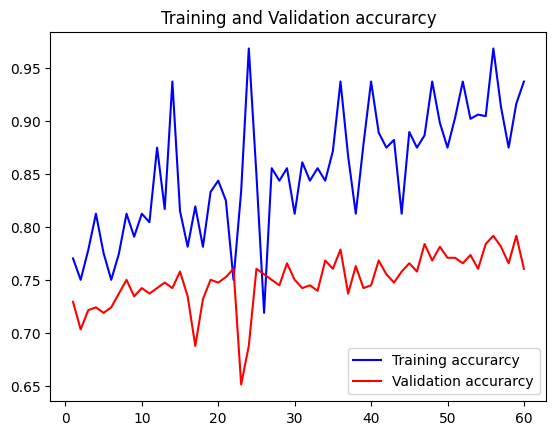

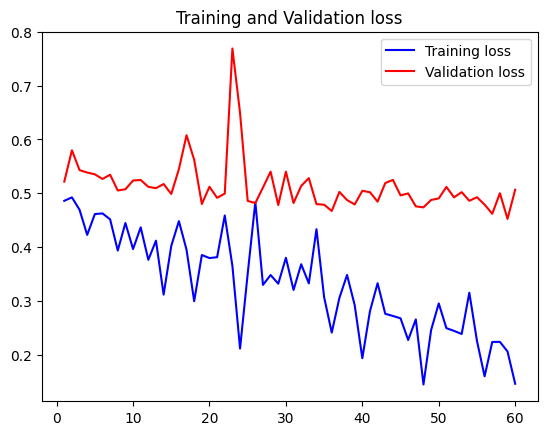

In [22]:
plot_perf(history)

First thing from this plot to note is that we’re not overfitting as the train and validation accuracy are pretty close and following each other. We can also notice that the accuracy keeps increasing as the epoch increases, giving us the intuition that increasing the epoch size will likely give us a higher accuracy.

Now, you can try increasing the epoch size and play around with some hyperparameters and see if the accuracy increase.

Finally, to test our model on some Images from the test set.

In [23]:
X_test, y_test = read_and_process_image(test_imgs[0:10])
x = np.array(X_test)
test_datagen = ImageDataGenerator(rescale=1./255)

We perform the same pre-processing we did in the train and validation set. We read and convert the first 10 images in our test set to a list of arrays.
We convert the list of arrays to one big numpy array. We create a test ImageDataGenerator and perform normalization only. Now we’ll create a simple for loop, that iterates over the Images from the generator to make predictions. Then we’ll plot the results.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 821ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


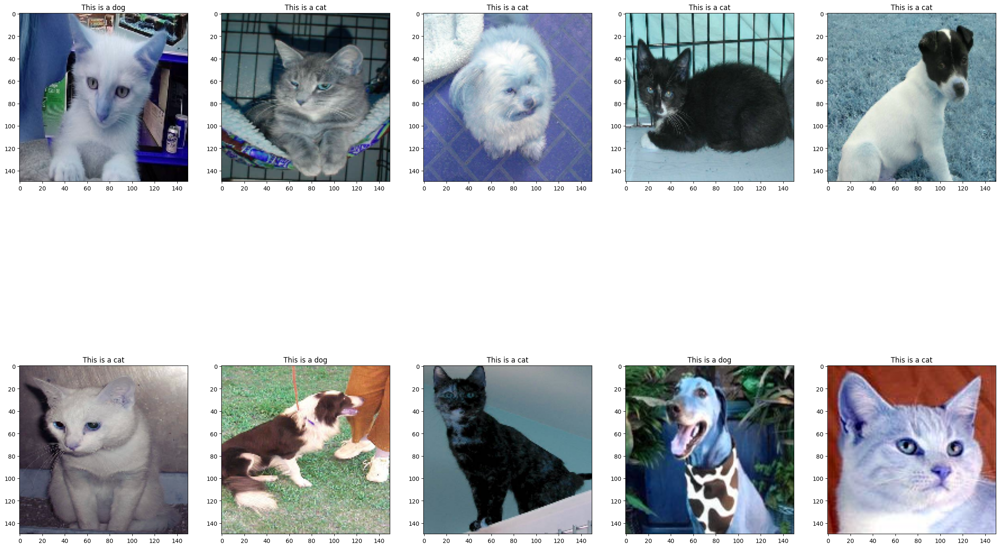

In [24]:
i = 0
text_labels = []
plt.figure(figsize=(30,20))
for batch in test_datagen.flow(x, batch_size=1):
  pred = model.predict(batch)
  if pred > 0.5:
    text_labels.append('dog')
  else:
    text_labels.append('cat')
  plt.subplot((5 // columns) + 1, columns, i + 1)
  plt.title('This is a ' + text_labels[i])
  imgplot = plt.imshow(batch[0])
  i += 1
  if i % 10 == 0:
    break
plt.show()

Here we make a prediction on that particular image provided by the ImageDataGenerator by calling the predict( ) method on our trained model. The pred variable is a probability of how sure the model is that the current image is a dog. Since we gave dogs a label of 1, a high probability — at least greater than average 0.5 — means our model is very confident that the image is a Dog, otherwise it is a cat.

**2- Multi-Classification on clothe dataset**

**Data loading**

Based on the tutorial above, it is requested to implement a CNN-based network to perform a multi-label classification solution. Download the image dataset "data.zip" available here:
https://drive.google.com/file/d/1uzR8oW7F4ONyptQQeN09MqIa4Oo2An4m/view?usp=sharing
This dataset contains 8 categories of images distributed as shown in the following structure (in total 22 directories):

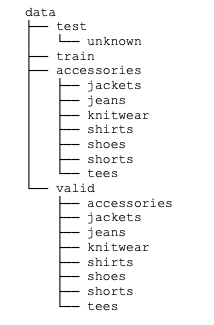

In [25]:
# Monter votre Drive afin de pouvoir y'acceder
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [26]:
# nous supposons que la base d'image se trouve dans le répertoire "IA-Vision" de votre Drive
from zipfile import ZipFile
file_name = "/content/drive/MyDrive/Machine Learning/CNN/data_clothes.zip"

with ZipFile(file_name, 'r') as zip:
  zip.extractall("data_clothes")
  print('Done')

Done


**Backage Import**


In [27]:
!pip install pydrive
import os
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from zipfile import ZipFile
from google.colab.patches import cv2_imshow
import tensorflow as tf
from tensorflow.keras import models,optimizers,layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import TensorBoard

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 987.4/987.4 kB 21.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pydrive: filename=PyDrive-1.3.1-py3-none-any.whl size=27433 sha256=f50a5af2219e08b0475a5c6b97127f994f57c66302f77107a5902172aecbce3e
  Stored in directory: /root/.cache/pip/wheels/6c/10/da/a5b513f5b3916fc391c20ee7b4633e5cf3396d570cdd74970f
Successfully built pydrive


The file is alreday split into three dataset : Train, Validation and Test.

Images are divided in 8 classes :

*   **Accessories**
*   **jackets**
*   **jeans**
*   **knitwear**
*   **shirts**
*   **shoes**
*   **shorts**
*   **tees**

An example of the images in the dataset. All the images have a size of 432x300x3.

(432, 300, 3)


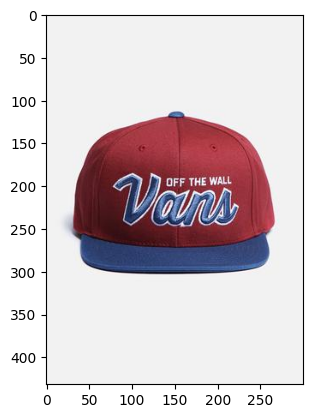

In [31]:
# un exemple de lecture/affichage d'une image
img=plt.imread("/content/data_clothes/data/train/accessories/productimg_1.jpg")
plt.imshow(img)
print(img.shape)

In [34]:
img2 = cv2.resize(cv2.imread("data_clothes/data/train/accessories/productimg_1.jpg"),(150,150),interpolation=cv2.INTER_CUBIC)

**Reading and processing of the images**

We can resize all our images to a size of 266x150x3 (to speed up the training phase).
The labels are one-hot encoded, which means they are represented as an of length n (the number of class) with the value 1 on the associated label index and 0 on the others. The images are shuffled.

Datasets sizes :

*  Train : 3467
*  Validation : 382
*  Test : 8

*NB : the test dataset apppears to be really small. However, we only want to explore methods and not to find the best model for this problem.*  





In [38]:
# Chargement de toutes les uimages:
path="/content/data_clothes/data/"
train_dir = path+"train/"
test_dir = path+"valid/"
from sklearn.utils import shuffle

# Je redimensionne toutes nos images à une taille de 266x150x3 (surtout pour accélérer la phase d'apprentissage).
# Les étiquettes sont encodées au format one-hot, ce qui signifie qu'elles sont représentées comme un de longueur n (le nombre de classe) avec la valeur 1 sur l'index d'étiquette associé et 0 sur les autres.
# Les images sont mélangées (on utilise pour cela shuffle())

rows=266
columns=150

def read_process(dataset,columns,rows,rand=True):
    labels=["accessories","jackets","jeans","knitwear","shirts","shoes","shorts","tees"]
    dir=path+dataset+"/"
    X,Y=[],[]
    for j,label in enumerate(labels):
        for file in os.listdir(dir+label+"/"):
            X.append(cv2.resize(cv2.imread(dir+label+"/"+file),(columns,rows),interpolation=cv2.INTER_CUBIC))
            y=[0 for _ in range(len(labels))]
            y[j]=1
            Y.append(y)
    if rand :
        return shuffle(np.array(X),np.array(Y))
    else:
        return np.array(X),np.array(Y)

def read_process_test(columns,rows):
    X_test=[]
    for file in os.listdir("/content/data_clothes/data/test/unknown/"):
        X_test.append(cv2.resize(cv2.imread("/content/data_clothes/data/test/unknown/"+file),(columns,rows),interpolation=cv2.INTER_CUBIC))
    return np.array(X_test)

X_train,Y_train=read_process("train",columns,rows)
X_val,Y_val=read_process("valid",columns,rows)
X_test=read_process_test(150,266)

Next, let's check the shape of our data. We can see that our train images are a rank 4 tensor, or we could say a 4 dimensional array with dimensions 3467 x 266 x 150 x 3 which respectively correspond to the size, height, width and channels of the lot.

In [39]:
print(X_train.shape,Y_train.shape)
print(X_val.shape,Y_val.shape)
print(X_test.shape)

(3467, 266, 150, 3) (3467, 8)
(382, 266, 150, 3) (382, 8)
(8, 266, 150, 3)


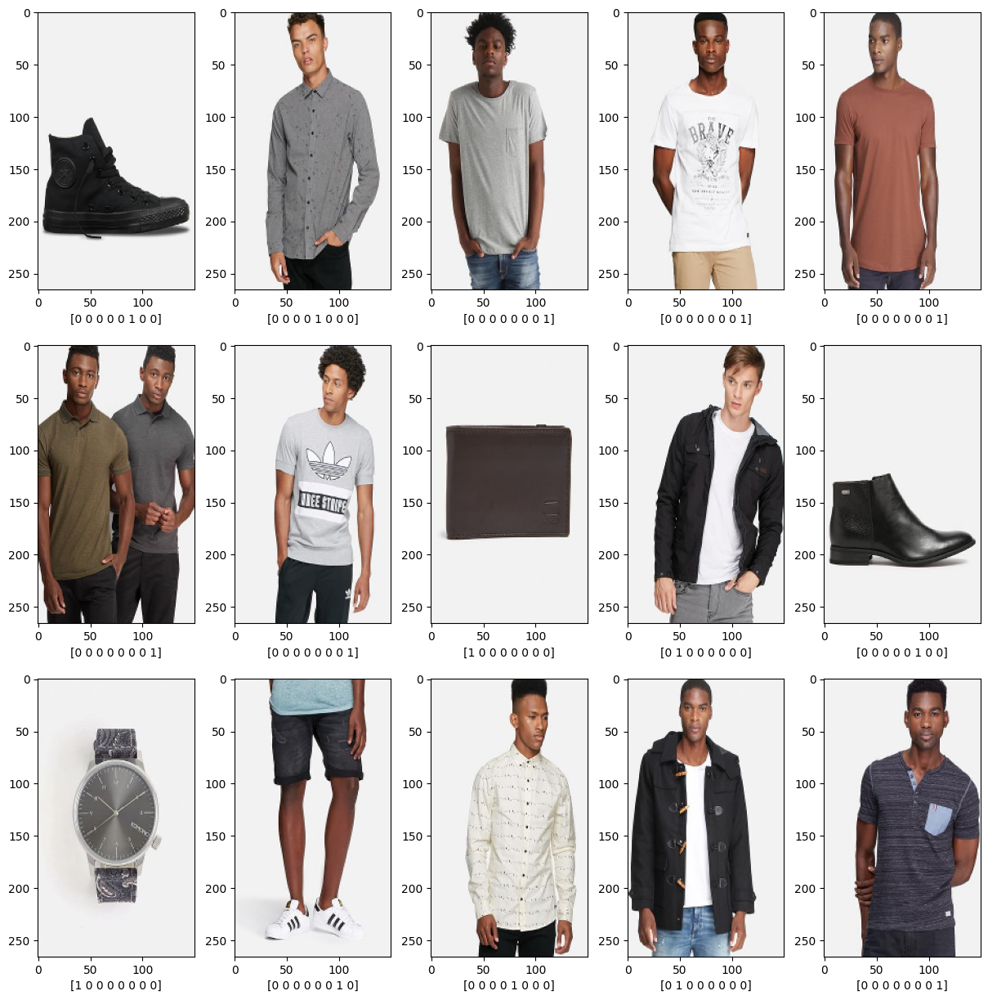

In [40]:
fig, axs = plt.subplots(nrows=3, ncols=5, figsize=(15,15))
for i, ax in enumerate(axs.flatten()):
    plt.imshow(cv2.cvtColor(X_train[i], cv2.COLOR_BGR2RGB))
    plt.xlabel(str(Y_train[i]))
    plt.sca(ax)
plt.show()


**2.1. Image calssification from-scratch**

Design your model from scratch with an architecture similar to that presented in the tutorial a typical CNN, in which the first part consists of Convolutional and max-pooling layers which act as the feature extractor. The second part consists of the fully connected layer which performs non-linear transformations of the extracted features and acts as the classifier.
For training the network, you follow the same workflow of create -> compile -> fit described above. Since it is a 8 class classification problem, you can use a categorical cross entropy loss and use RMSProp optimizer to train the network. Run it for some number of epochs (20 epochs)

**2.2. With Data Augmentation**

One of the major reasons for overfitting is that you don’t have enough data to train your network. Apart from regularization, another very effective way to counter Overfitting is Data Augmentation. It is the process of artificially creating more images from the images you already have by changing the size, orientation etc of the image. It can be a tedious task but fortunately, this can be done in Keras using the ImageDataGenerator instance. Similare to above, train your model with Data Augmentation. Plot performance curves that show the evaluation of your model (TensorBoard with Keras is via a Keras callback).

**2.3. Image classification using different pre-trained models**

ImageNet Large Scale Visual Recognition Challenge ([ILSVRC](https://image-net.org/challenges/LSVRC/2017/index)) is an annual competition organized by the ImageNet team since 2010, where research teams evaluate their computer vision algorithms various visual recognition tasks such as Object Classification and Object Localization. The training data is a subset of ImageNet with 1.2 million images belonging to 1000 classes.

The winners of ILSVRC have been very generous in releasing their models to the open-source community. There are many models such as AlexNet, VGGNet, Inception, ResNet, Xception and many more which we can choose from, for our own task. Apart from the ILSVRC winners, many research groups also share their models which they have trained for similar tasks, e.g, MobileNet, SqueezeNet etc.
These networks are trained for classifying images into one of 1000 categories or classes.
In order to perform tests with these models, We can load the models in Keras using the following code:

In [41]:
# In this part, we use major pretrained model with ImageNet to observes their predictions.
# The examples below are dedicated to VGG16 but are appliable to other CNN architectures.
# Their input shape is 224x224 so it is necessary to resize all the images.

import numpy as np
from tensorflow.keras.applications import vgg16, inception_v3, resnet50, mobilenet

X_train,Y_train=read_process("train",224,224)
X_val,Y_val=read_process("valid",224,224)

vgg_model = vgg16.VGG16(weights='imagenet')

# inception_model = inception_v3.InceptionV3(weights='imagenet')

#resnet_model = resnet50.ResNet50(weights='imagenet')

#mobilenet_model = mobilenet.MobileNet(weights='imagenet')

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


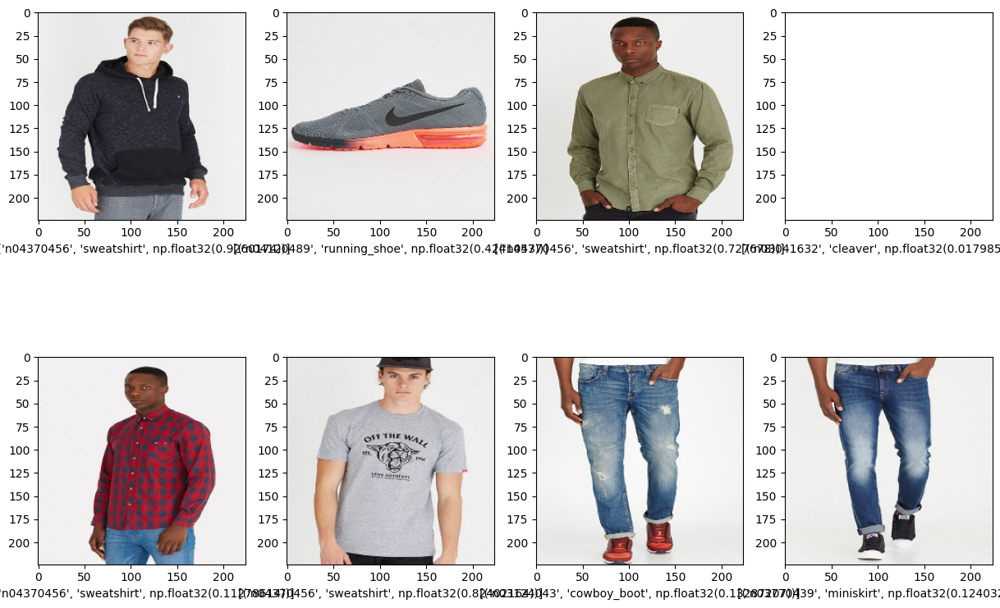

In [42]:
X_test=read_process_test(224,224)

processed_image = vgg16.preprocess_input(X_test)
predictions = vgg_model.predict(processed_image)

Y_test=vgg16.decode_predictions(predictions,top=1)

fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(15,10))
for i, ax in enumerate(axs.flatten()):
    plt.imshow(cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB))
    plt.xlabel(Y_test[i])
    plt.sca(ax)
plt.show()

Compare results from various models on several images.
We can conclude from obtained results that to have a good performance on our own dataset, we have to train a classifier using these same models with our own data to recognize any other set of objects which are not present in the ILSVRC dataset.

**2.4	Transfer Learning using pre-trained models:**

The pre-trained models are trained on very large-scale image classification problems. The convolutional layers act as feature extractor and the fully connected layers act as Classifiers. Since these models are very large and have seen a huge number of images, they tend to learn very good, discriminative features. When we have a small training set and our problem is similar to the task for which the pre-trained models were trained, we can use transfer learning.

Let's put this in practice by using the convolutional base of the VGG16 network, trained on ImageNet. You can import the VGG16 model which comes pre-packaged in Keras from the keras.applications module. Start by instantiate it by passing three arguments to the constructor:
o	weights, to specify which weight checkpoint to initialize the model from
o	include_top, which refers to including or not the densely-connected classifier on top of the network. By default, this densely-connected classifier would correspond to the 1000 classes from ImageNet. Since we intend to use our own densely-connected classifier (with only two classes, cat and dog), we don't need to include it.
o	input_shape, the shape of the image tensors that we will feed to the network. This argument is purely optional: if we don't pass it, then the network will be able to process inputs of any size. In our case, the image size is 224.

In [43]:
from tensorflow.keras.applications import VGG16

batch_size=32

conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))
conv_base.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

Print the detail of the architecture of the VGG16 convolutional base. You can see that the final feature map has shape (7, 7, 512). That's the feature on top of which we will stick a densely-connected classifier. At this point, there are two ways we could proceed:
o	Running the convolutional base over our dataset, recording its output to a Numpy array on disk, then using this data as input to a standalone densely-connected classifier similar to those you have developed in the from-scratch version.
o	Extending the model we have (conv_base) by adding Dense layers on top, and running the whole thing end-to-end on the input data. This allows us to use data augmentation, because every input image is going through the convolutional base every time it is seen by the model. However, this technique is more expensive than the first one.

**1st technique of feature extraction**:
Start as above by loading the images using the ImageDataGenerator class and then generate batches of images and labels using the function flow_from_directory.
Then, we use model.predict() function to pass the image through the network which gives us a 7 x 7 x 512 dimensional Tensor. We reshape the Tensor into a vector. Similarly, we find the validation_features.

In [44]:
X_train,Y_train=read_process("train",224,224)
X_val,Y_val=read_process("valid",224,224)

nTrain = len(X_train)
nVal = len(X_val)

train_features,val_features = conv_base.predict(X_train),conv_base.predict(X_val)
train_features,val_features = np.reshape(train_features, (nTrain, 7 * 7 * 512)),np.reshape(val_features, (nVal, 7 * 7 * 512))

print(train_features.shape,Y_train.shape)
print(val_features.shape,Y_val.shape)


109/109 ━━━━━━━━━━━━━━━━━━━━ 39s 230ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step
(3467, 25088) (3467, 8)
(382, 25088) (382, 8)


So for each image we obtain 512 features of size 7x7. We flatten them and process them through our classifier. As an example we plot some of these intermediary features (9 feature maps of size 28x28)).

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


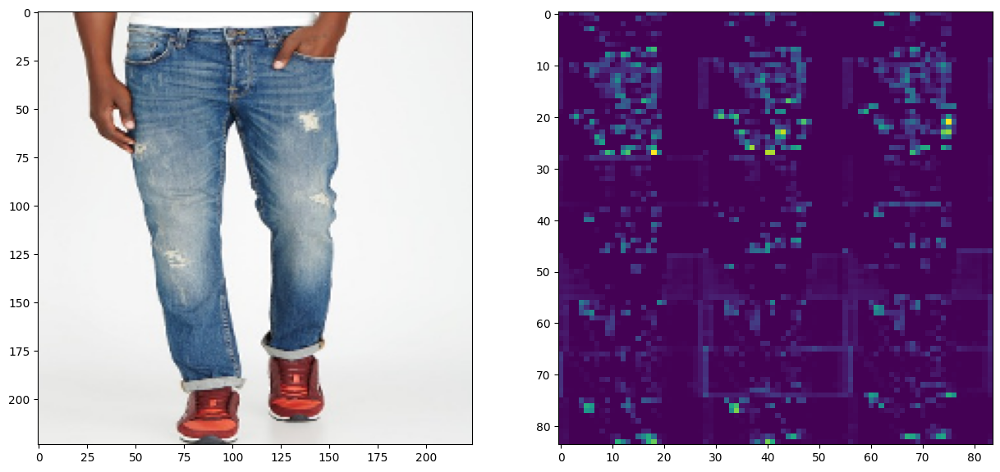

In [45]:
X_test=read_process_test(224,224)[-1]
conv_base_demo=models.Sequential()
for i in range(11):
    conv_base_demo.add(conv_base.layers[i])
predictions = conv_base_demo.predict(np.array([X_test]))

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15,10))
ax1.imshow(cv2.cvtColor(X_test, cv2.COLOR_BGR2RGB))
output=[]
for i in range(3):
    row=[]
    for j in range(3):
        pred=predictions[0,:,:,3*i+j]
        row.append(pred)
    output.append(row)
ax2.imshow(np.reshape(output,(84,84)))
plt.show()

At this point, we can define our densely-connected classifier (note the use of dropout for regularization) layer having 3 classes, and train it on the data and labels that we just recorded:


In [46]:
model2 = models.Sequential()
model2.add(layers.Dense(256, activation='relu', input_dim=7 * 7 * 512))
model2.add(layers.Dropout(0.5))
model2.add(layers.Dense(8, activation='softmax'))
print(model2.summary())

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                 │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,424,840 (24.51 MB)

 Trainable params: 6,424,840 (24.51 MB)

 Non-trainable params: 0 (0.00 B)

None


Train the network by calling model12.compile() then model.fit() function as we have seen in our earlier exercise, and check its performance.


Epoch 1/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - acc: 0.6399 - loss: 10.6624 - val_acc: 0.8874 - val_loss: 1.1111
Epoch 2/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - acc: 0.9018 - loss: 0.8838 - val_acc: 0.9372 - val_loss: 0.4581
Epoch 3/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - acc: 0.9287 - loss: 0.4537 - val_acc: 0.9398 - val_loss: 0.3635
Epoch 4/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - acc: 0.9550 - loss: 0.2482 - val_acc: 0.9450 - val_loss: 0.4243
Epoch 5/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - acc: 0.9700 - loss: 0.1618 - val_acc: 0.9607 - val_loss: 0.4216
Epoch 6/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - acc: 0.9739 - loss: 0.1058 - val_acc: 0.9503 - val_loss: 0.4178
Epoch 7/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - acc: 0.9717 - loss: 0.1256 - val_acc: 0.9372 - val_loss: 0.3991
Epoch 8/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - acc: 0.9682 - loss: 0.1605 - val_acc: 0.9555 - val_loss: 0.5356
Epoch 9/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - acc: 0.981

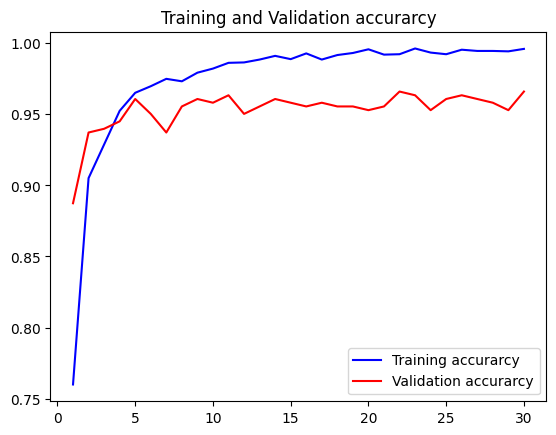

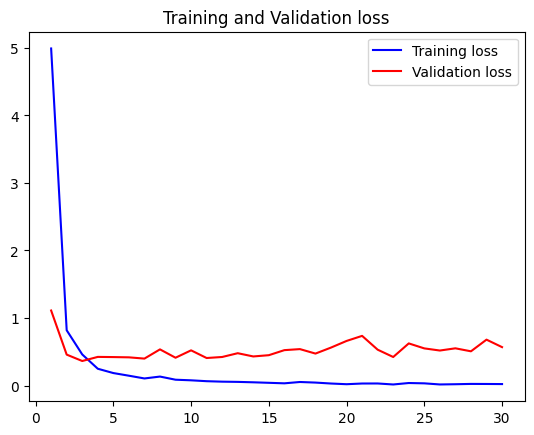

In [47]:
#DONE : entraînement du classifieur sur features VGG16 gelées

model2.compile(loss='categorical_crossentropy',
               optimizer=optimizers.RMSprop(learning_rate=1e-4),
               metrics=['acc'])

history = model2.fit(
    train_features, Y_train,
    epochs=30,
    batch_size=128,
    validation_data=(val_features, Y_val)
)

plot_perf(history)


Using the training set (not augmentated) resulted in an overfitted behavior, we can either proceed by augmenting the data or adding regularization methods : dropout layer, reg l1/l2 for example.

**Train more layers in the architecture**
If you train more layers in the proposed architecture you will certainly obtain a better accuracy. For example, freeze the network except the three last weight layers.

In [49]:
#DONE : Classifieur régularisé un peu plus riche sur les features

from tensorflow.keras import regularizers

model3 = models.Sequential()
model3.add(layers.Dense(512, activation='relu',
                        input_dim=7 * 7 * 512,
                        kernel_regularizer=regularizers.l2(1e-4)))
model3.add(layers.Dropout(0.5))
model3.add(layers.Dense(256, activation='relu',
                        kernel_regularizer=regularizers.l2(1e-4)))
model3.add(layers.Dropout(0.5))
model3.add(layers.Dense(8, activation='softmax'))
print(model3.summary())

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,978,952 (49.51 MB)

 Trainable params: 12,978,952 (49.51 MB)

 Non-trainable params: 0 (0.00 B)

None


Epoch 1/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - acc: 0.5673 - loss: 13.5209 - val_acc: 0.8953 - val_loss: 0.8622
Epoch 2/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - acc: 0.8063 - loss: 2.3363 - val_acc: 0.9110 - val_loss: 0.8175
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - acc: 0.8527 - loss: 1.5805 - val_acc: 0.9372 - val_loss: 0.4756
Epoch 4/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - acc: 0.8690 - loss: 1.2328 - val_acc: 0.9424 - val_loss: 0.5446
Epoch 5/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - acc: 0.8995 - loss: 0.9689 - val_acc: 0.9476 - val_loss: 0.4960
Epoch 6/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - acc: 0.8943 - loss: 0.8454 - val_acc: 0.9503 - val_loss: 0.4125
Epoch 7/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - acc: 0.9123 - loss: 0.6875 - val_acc: 0.9476 - val_loss: 0.4058
Epoch 8/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - acc: 0.9249 - loss: 0.6906 - val_acc: 0.9503 - val_loss: 0.4345
Epoch 9/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - acc: 0.93

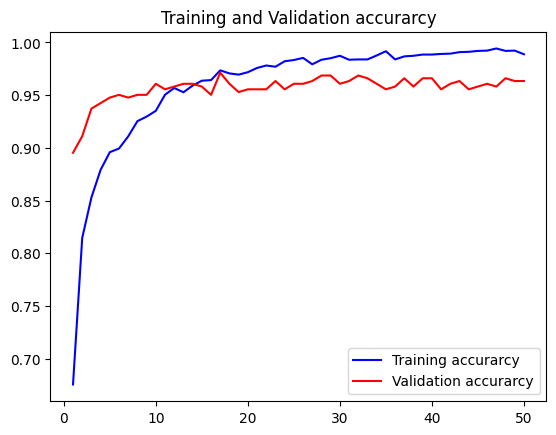

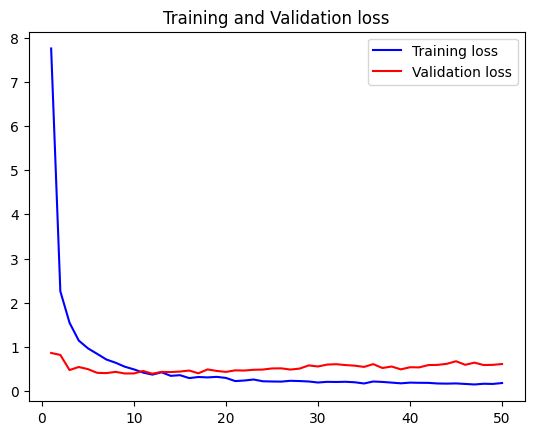

In [51]:
model3.compile(loss='categorical_crossentropy', optimizer=optimizers.RMSprop(learning_rate=1e-4), metrics=['acc'])
history = model3.fit(train_features, Y_train,
                                steps_per_epoch=len(X_train) // 128,
                                epochs=50,
                                validation_data=[val_features, Y_val],
                                validation_steps=len(X_val) // 128,
                                )
plot_perf(history)

If you would like to visualize how images were classified, you can use this part of code:

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


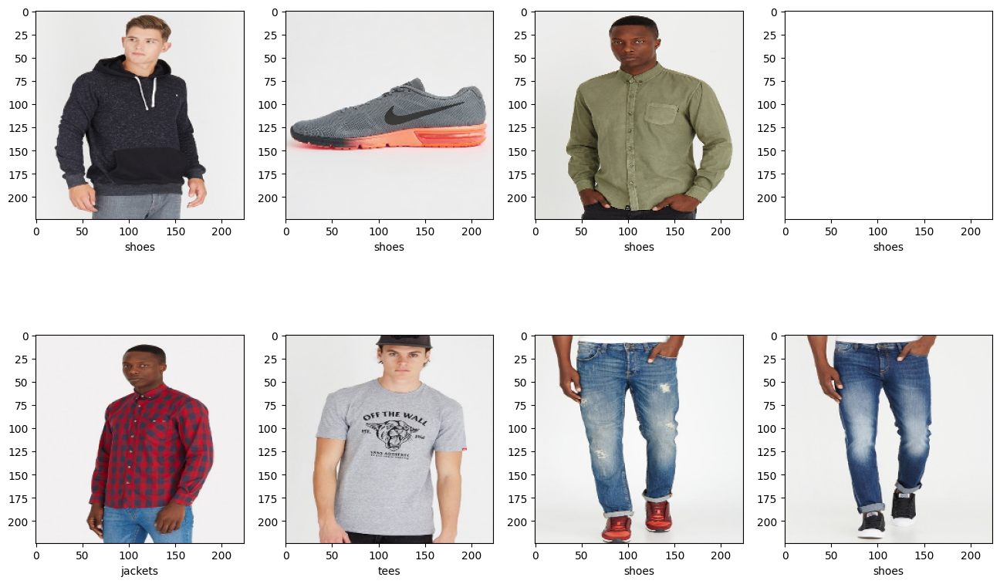

In [52]:
labels=["accessories","jackets","jeans","knitwear","shirts","shoes","shorts","tees"]
X_test=read_process_test(224,224)
Y_test=model2.predict(np.reshape(conv_base.predict(X_test/255),(len(X_test),7*7*512)))
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(16,10))
for i, ax in enumerate(axs.flatten()):
    plt.imshow(cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB))
    plt.xlabel(labels[np.argmax(Y_test[i])])
    plt.sca(ax)
plt.show()

In [53]:
'''fnames = validation_generator.filenames
ground_truth = validation_generator.classes
label2index = validation_generator.class_indices
# Getting the mapping from class index to class label
idx2label = dict((v, k) for k, v in label2index.iteritems())
predictions = model12.predict_classes(validation_features)
prob = model12.predict(validation_features)

# to see which images were predicted wrongly
errors = np.where(predictions != ground_truth)[0]print("No of errors = {}/{}".format(len(errors), nVal))
for i in range(len(errors)):
  pred_class = np.argmax(prob[errors[i]])
  pred_label = idx2label[pred_class]
  print('Original label:{}, Prediction :{}, confidence : {:.3f}'.format(fnames[errors[i]].split('/')[0],        pred_label,        prob[errors[i]][pred_class]))    original = load_img('{}/{}'.format(validation_dir, fnames[errors[i]]))    plt.imshow(original)    plt.show()
'''

'fnames = validation_generator.filenames\nground_truth = validation_generator.classes\nlabel2index = validation_generator.class_indices\n# Getting the mapping from class index to class label\nidx2label = dict((v, k) for k, v in label2index.iteritems())\npredictions = model12.predict_classes(validation_features)\nprob = model12.predict(validation_features)\n\n# to see which images were predicted wrongly\nerrors = np.where(predictions != ground_truth)[0]print("No of errors = {}/{}".format(len(errors), nVal))\nfor i in range(len(errors)):\n  pred_class = np.argmax(prob[errors[i]])\n  pred_label = idx2label[pred_class]\n  print(\'Original label:{}, Prediction :{}, confidence : {:.3f}\'.format(fnames[errors[i]].split(\'/\')[0],        pred_label,        prob[errors[i]][pred_class]))    original = load_img(\'{}/{}\'.format(validation_dir, fnames[errors[i]]))    plt.imshow(original)    plt.show()\n'

**2nd technique of feature extraction**:
consists of extending the conv_base model and running it end-to-end on the inputs. So you can do the following:

In [54]:
model12 = models.Sequential()
model12.add(conv_base)
model12.add(layers.Flatten())
model12.add(layers.Dense(256, activation='relu'))
model12.add(layers.Dense(8, activation='softmax'))

This is what our model looks like now:


In [55]:
model12.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,139,528 (80.64 MB)

 Trainable params: 21,139,528 (80.64 MB)

 Non-trainable params: 0 (0.00 B)

As you can see, the convolutional base of VGG16 has 14,714,688 parameters, which is very large. The classifier we are adding on top has 6 million parameters. Before we compile and train our model, a very important thing to do is to freeze the convolutional base. "Freezing" a layer or set of layers means preventing their weights from getting updated during training. If we don't do this, then the representations that were previously learned by the convolutional base would get modified during training. Since the Dense layers on top are randomly initialized, very large weight updates would be propagated through the network, effectively destroying the representations previously learned. In Keras, freezing a network is done by setting its trainable attribute to False:

In [56]:
conv_base.trainable = False

With this setup, only the weights from the two Dense layers that we added will be trained. That's a total of four weight tensors: two per layer (the main weight matrix and the bias vector). Now we can start training our model, with optionally a data augmentation configuration that we used in our previous exercise:

In [57]:
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=40,
                                   width_shift_range=0.2,height_shift_range=0.2,
                                   shear_range=0.2, zoom_range=0.2,
                                   vertical_flip=True,)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow(X_train, Y_train, batch_size=batch_size)
val_generator = val_datagen.flow(X_val, Y_val, batch_size=batch_size)

Train the network by calling model.fit() function and check its performance as we have seen above.

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 51s 455ms/step - acc: 0.5937 - loss: 1.2922 - val_acc: 0.8551 - val_loss: 0.3836
Epoch 2/30
  1/108 ━━━━━━━━━━━━━━━━━━━━ 18s 169ms/step - acc: 0.8438 - loss: 0.5580

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - acc: 0.8438 - loss: 0.5580 - val_acc: 0.8551 - val_loss: 0.4064
Epoch 3/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 47s 434ms/step - acc: 0.8293 - loss: 0.4836 - val_acc: 0.8949 - val_loss: 0.3309
Epoch 4/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - acc: 0.8438 - loss: 0.3793 - val_acc: 0.9062 - val_loss: 0.2949
Epoch 5/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 47s 434ms/step - acc: 0.8620 - loss: 0.3962 - val_acc: 0.9176 - val_loss: 0.2285
Epoch 6/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - acc: 0.7812 - loss: 0.4028 - val_acc: 0.9006 - val_loss: 0.2918
Epoch 7/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 47s 430ms/step - acc: 0.8792 - loss: 0.3523 - val_acc: 0.9091 - val_loss: 0.2504
Epoch 8/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - acc: 0.9062 - loss: 0.2634 - val_acc: 0.9290 - val_loss: 0.2207
Epoch 9/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 47s 436ms/step - acc: 0.8753 - loss: 0.3488 - val_acc: 0.9290 - val_loss: 0.1941
Epoch 10/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/st

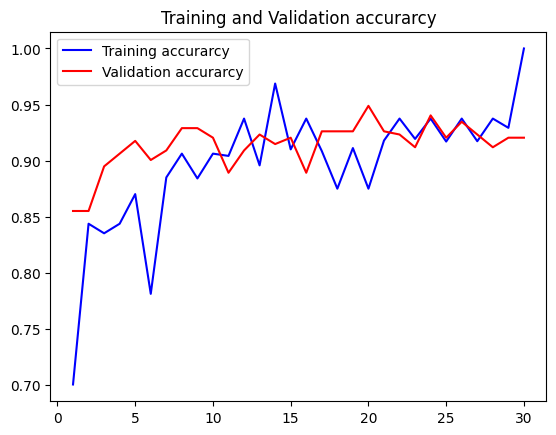

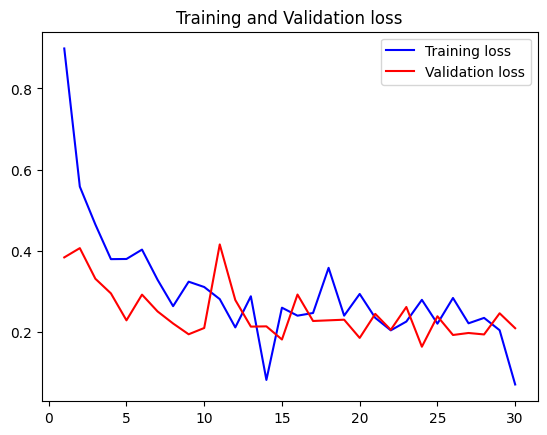

In [58]:
# DONE : entraînement end-to-end avec conv_base gelée + data aug

model12.compile(loss='categorical_crossentropy',
                optimizer=optimizers.RMSprop(learning_rate=1e-4),
                metrics=['acc'])

history = model12.fit(
    train_generator,
    steps_per_epoch=len(X_train) // batch_size,
    epochs=30,
    validation_data=val_generator,
    validation_steps=len(X_val) // batch_size
)

plot_perf(history)

**2.5. Fine-Tuning a pre-trained model**

Fine-tuning consists in unfreezing a few of the top layers of a frozen model base used for feature extraction, and jointly training both the newly added part of the model (in our case, the fully-connected classifier) and these top layers. As explained later in the course, the initial layers learn very general features and as we go higher up the network, the layers tend to learn patterns more specific to the task it is being trained on. Thus, for fine-tuning, we want to keep the initial layers intact (or freeze them) and retrain the later layers for our task. Note also that, the more parameters we are training, the more we are at risk of overfitting.

First, we will load a VGG model without the top layer (which consists of fully connected layers). Then, we will fine-tune the last 4 layers:

In [59]:
conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))

# Freeze the layers except the last 4 layers
for layer in conv_base.layers[:-4]:
  layer.trainable = False
  # Check the trainable status of the individual layers
  for layer in conv_base.layers:
    print(layer, layer.trainable)

<InputLayer name=input_layer_6, built=True> False
<Conv2D name=block1_conv1, built=True> True
<Conv2D name=block1_conv2, built=True> True
<MaxPooling2D name=block1_pool, built=True> True
<Conv2D name=block2_conv1, built=True> True
<Conv2D name=block2_conv2, built=True> True
<MaxPooling2D name=block2_pool, built=True> True
<Conv2D name=block3_conv1, built=True> True
<Conv2D name=block3_conv2, built=True> True
<Conv2D name=block3_conv3, built=True> True
<MaxPooling2D name=block3_pool, built=True> True
<Conv2D name=block4_conv1, built=True> True
<Conv2D name=block4_conv2, built=True> True
<Conv2D name=block4_conv3, built=True> True
<MaxPooling2D name=block4_pool, built=True> True
<Conv2D name=block5_conv1, built=True> True
<Conv2D name=block5_conv2, built=True> True
<Conv2D name=block5_conv3, built=True> True
<MaxPooling2D name=block5_pool, built=True> True
<InputLayer name=input_layer_6, built=True> False
<Conv2D name=block1_conv1, built=True> False
<Conv2D name=block1_conv2, built=True>

Now that we have set the trainable parameters of our base network, we would like to add a classifier on top of the convolutional base, and set up the data for training exactly like the previous exercise. Check out the performance. To see the effect of fine-tuning and data augmentation, you can perform experiments with and without data augmentation, and with freezing all layers and learning a classifier on top of it, similar to transfer learning, and training the last 3 convolutional layers.

Epoch 1/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 56s 466ms/step - acc: 0.4730 - loss: 1.5633 - val_acc: 0.8153 - val_loss: 0.4983
Epoch 2/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - acc: 0.6562 - loss: 0.8975 - val_acc: 0.8352 - val_loss: 0.4839
Epoch 3/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 47s 435ms/step - acc: 0.7524 - loss: 0.7057 - val_acc: 0.8864 - val_loss: 0.3003
Epoch 4/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - acc: 0.8125 - loss: 0.5701 - val_acc: 0.8864 - val_loss: 0.3266
Epoch 5/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 49s 450ms/step - acc: 0.8325 - loss: 0.4845 - val_acc: 0.9119 - val_loss: 0.2202
Epoch 6/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - acc: 0.9375 - loss: 0.1987 - val_acc: 0.9091 - val_loss: 0.2333
Epoch 7/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 80s 448ms/step - acc: 0.8488 - loss: 0.4253 - val_acc: 0.9233 - val_loss: 0.2184
Epoch 8/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - acc: 0.8438 - loss: 0.5353 - val_acc: 0.9205 - val_loss: 0.2021
Epoch 9/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 

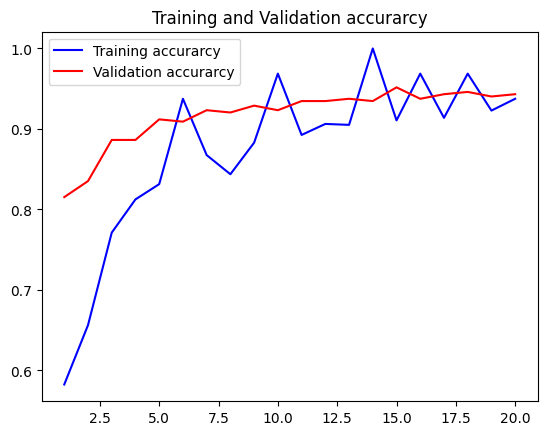

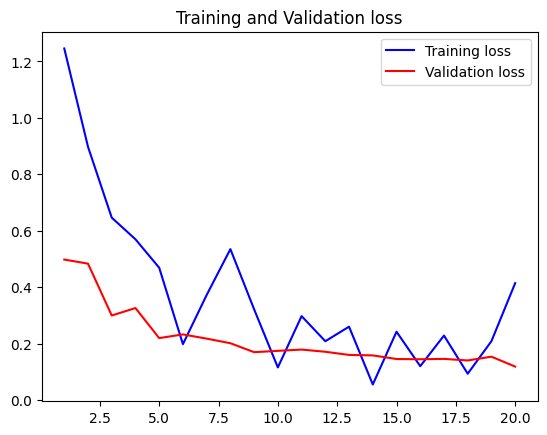

In [60]:
# fine-tuning des 4 dernières couches de VGG16

model_finetune = models.Sequential([
    conv_base,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(8, activation='softmax')
])

ft_train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2, height_shift_range=0.2,
    shear_range=0.2, zoom_range=0.2,
    horizontal_flip=True
)
ft_val_datagen = ImageDataGenerator(rescale=1./255)

ft_train_gen = ft_train_datagen.flow(X_train, Y_train, batch_size=batch_size)
ft_val_gen = ft_val_datagen.flow(X_val, Y_val, batch_size=batch_size)

model_finetune.compile(loss='categorical_crossentropy',
                       optimizer=optimizers.RMSprop(learning_rate=1e-5),
                       metrics=['acc'])

history = model_finetune.fit(
    ft_train_gen,
    steps_per_epoch=len(X_train) // batch_size,
    epochs=20,
    validation_data=ft_val_gen,
    validation_steps=len(X_val) // batch_size
)

plot_perf(history)
